
# PTSD Model Inference with IRT Features

## [Center for Health Statistics](http://www.healthstats.org)

## [The Zero Knowledge Discovery Lab](http://zed.uchicago.edu)
---



In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
import pandas as pd
import seaborn as sns
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import neighbors, datasets
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_blobs
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from scipy.spatial import ConvexHull
from tqdm import tqdm
import random
plt.style.use('ggplot')

%matplotlib inline

In [30]:
Df=pd.read_csv('BRCA23.csv',index_col=0)
X0=Df.drop(['cancer'],axis=1).values
y0=Df.cancer.values
X, X_test0, y, y_test0 = train_test_split(X0, y0, test_size=0.5)

In [31]:
def getAuc(X,y,test_size=0.25,max_depth=None,n_estimators=100,
           minsplit=4,FPR=[],TPR=[],VERBOSE=False, USE_ONLY=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
    CLASSIFIERS=[DecisionTreeClassifier(max_depth=max_depth, min_samples_split=minsplit),
                RandomForestClassifier(n_estimators=n_estimators,
                                       max_depth=max_depth,min_samples_split=minsplit),
                ExtraTreesClassifier(n_estimators=n_estimators,
                                     max_depth=max_depth,min_samples_split=minsplit),
                AdaBoostClassifier(n_estimators=n_estimators),
                GradientBoostingClassifier(n_estimators=n_estimators,max_depth=max_depth),
                svm.SVC(kernel='rbf',gamma='scale',class_weight='balanced',probability=True)]

    if USE_ONLY is not None:
        if isinstance(USE_ONLY, (list,)):
            CLASSIFIERS=[CLASSIFIERS[i] for i in USE_ONLY]
        if isinstance(USE_ONLY, (int,)):
            CLASSIFIERS=CLASSIFIERS[USE_ONLY]

    for clf in CLASSIFIERS:
        clf.fit(X_train,y_train)
        y_pred=clf.predict_proba(X_test)
        fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred[:,1], pos_label=1)
        auc=metrics.auc(fpr, tpr)
        if VERBOSE:
            print auc

        FPR=np.append(FPR,fpr)
        TPR=np.append(TPR,tpr)
    points=np.array([[a[0],a[1]] for a in zip(FPR,TPR)])
    hull = ConvexHull(points)
    x=np.argsort(points[hull.vertices,:][:,0])
    auc=metrics.auc(points[hull.vertices,:][x,0],points[hull.vertices,:][x,1])
    return auc,CLASSIFIERS

#test model
def getModel(P,THRESHOLD=0.9):
    Pgood=[model for (auc,model) in zip(P[::2],P[1::2]) if auc > THRESHOLD]
    AUC=[]
    if len(Pgood)==0:
        return Pgood,len(Pgood),0,0,0,[]
    for i in tqdm(range(1000)):
        random_choice=random.randint(0,len(Pgood)-1)
        clf=Pgood[random_choice][0]
        X_train, X_test, y_train, y_test = train_test_split(X_test0, y_test0, test_size=0.8)
        y_pred=clf.predict_proba(X_test)
        fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred[:,1], pos_label=1)
        auc=metrics.auc(fpr, tpr)
        AUC=np.append(AUC,auc)
    DEPTH=Pgood[0][0].max_depth
    N_ESTIMATORS=Pgood[0][0].n_estimators
    
    NITEMS=DEPTH*N_ESTIMATORS
    VARIATIONS=2*DEPTH*len(Pgood)
    return Pgood,len(Pgood),np.median(AUC),NITEMS,VARIATIONS,AUC

def getSystem(X,y,max_depth=2,n_estimators=3):
    P1=[]
    for i in tqdm(range(100)):
        P1=np.append(P1,getAuc(X,y,minsplit=2,max_depth=max_depth,n_estimators=n_estimators,USE_ONLY=[2]))
    PERF=[]
    DPERF={}
    MODELS={}
    for threshold in np.arange(0.5,0.8,0.1):
        Pgood,nmodels,auc_,NITEMS,VARIATIONS,AUC=getModel(P1,threshold)
        if len(Pgood) > 0:
            PERF=np.append(PERF,[auc_,NITEMS,VARIATIONS])
            DPERF[VARIATIONS]=AUC
            MODELS[auc_]=Pgood
    PERF=PERF.reshape(int(len(PERF)/3),3)    
    return PERF,DPERF,MODELS,NITEMS

def PLOT(Dperf,Nitems,N=1000,dn=''):
    NUMQ='No. of Items Per Subject: '+str(Nitems)
    Df=pd.DataFrame(Dperf)
    dfs=Df.std()
    dfm=Df.mean()
    plt.figure(figsize=[8,6])
    dfm.plot(marker='o',color='r',ms=10,markeredgecolor='w',markerfacecolor='k',lw=2)
    (dfm+2.62*(dfs/np.sqrt(N))).plot(ls='--',color='.5')
    (dfm-2.62*(dfs/np.sqrt(N))).plot(ls='--',color='.5')
    plt.xlabel('No. of different question sets')
    plt.ylabel('mean AUC')
    plt.title('AUC vs Test Variation (99% CB)',fontsize=12,fontweight='bold')
    plt.text(0.55,0.9,NUMQ,transform=plt.gca().transAxes,fontweight='bold',
             fontsize=12,bbox=dict(facecolor='k', alpha=0.4),color='w')
    pdfname='Result'+dn+'.pdf'
    plt.savefig(pdfname,dpi=300,bbox_inches='tight',pad_inches=0,transparent=False)
    return

100%|██████████| 1000/1000 [02:11<00:00,  7.55it/s]


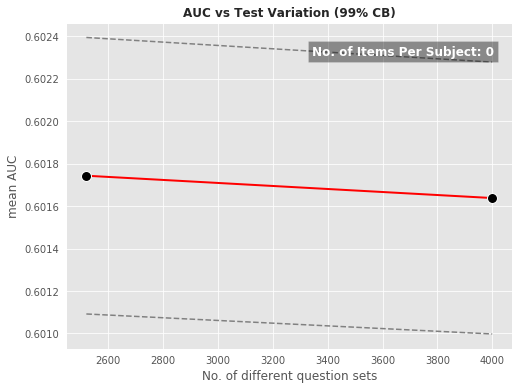

In [32]:
Perf23,Dperf23,Models23,Nitems23=getSystem(X,y,max_depth=20,n_estimators=300)
PLOT(Dperf23,Nitems23,dn='230')

In [26]:
Models23

{0.9745142950259158: [[ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
              max_depth=20, max_features='auto', max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=None,
              oob_score=False, random_state=None, verbose=0, warm_start=False)],
  [ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
              max_depth=20, max_features='auto', max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=None,
              oob_score=False, random_state=None, verbose=0, warm_start=False)],
  [ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
              max_depth=20, max_features='auto', max

In [27]:
count=0
estimator = Models23[0.9745142950259158][0][0].estimators_[count]


from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='tree.dot', 
                #feature_names = iris.feature_names,
                #class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree'+str(count)+'.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree'+str(count)+'.png')

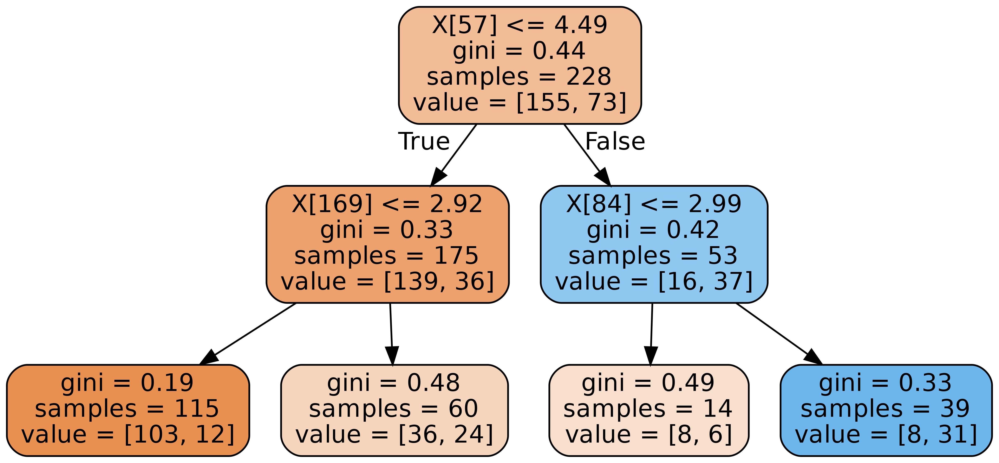

In [37]:
count=1
estimator = Models23[0.8717944763477246][0][0].estimators_[count]


from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='tree.dot', 
                #feature_names = iris.feature_names,
                #class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree'+str(count)+'.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree'+str(count)+'.png')

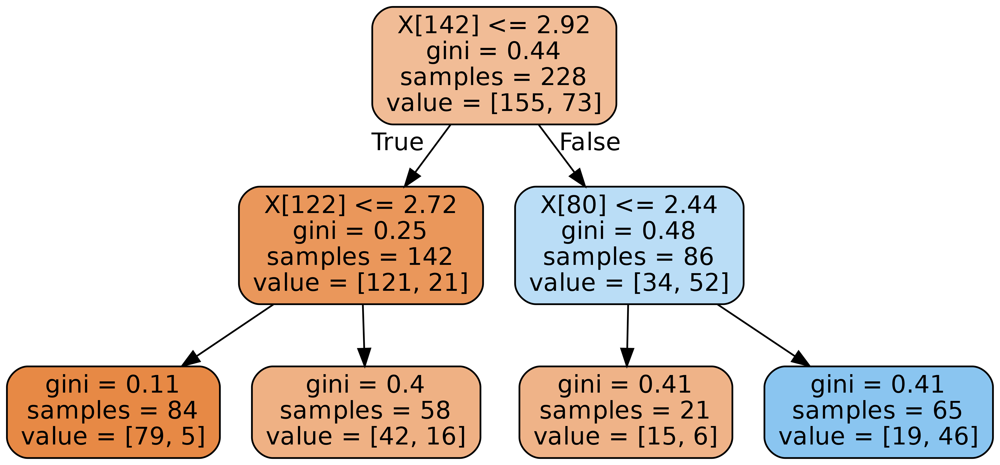

In [38]:
count=2
estimator = Models23[0.8717944763477246][0][0].estimators_[count]


from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='tree.dot', 
                #feature_names = iris.feature_names,
                #class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree'+str(count)+'.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree'+str(count)+'.png')

In [20]:
getAuc(X,y,minsplit=2,max_depth=30,n_estimators=300,USE_ONLY=[2])

(0.6077715514801607,
 [ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
             max_depth=30, max_features='auto', max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=None,
             oob_score=False, random_state=None, verbose=0, warm_start=False)])

In [28]:
Models23[0.9745142950259158][0][0].score(X_test,y_test)

0.5961109340133885